# Import Modules

In [1]:
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd

from skimage import color
from skimage import io

import os
import glob
import skimage.transform
import random

import torch
import torch.nn as nn
from torch.optim import Adam, SGD
from torch.autograd import Variable
from torchsummary import summary
from torch.utils.data import TensorDataset, DataLoader
from torchvision.transforms import transforms

from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.metrics import roc_curve, auc

random.seed(20)
torch.cuda.is_available()

True

In [2]:
# idx 210 - 3 gates
# idx 230 - 1 gate

idx = 210      # image index to display steps
feat_size = 16   # width and height of patch vector
n_points_corner = 20   # Number of points per corner
n_points_background = 500 # Number of total points in the background
n_samples = 2500 # Number of samples for evaluation image

# Load Data

In [3]:
def data_loader():

    # Obtain folder
    folder = os.getcwd()
    folder2 = os.path.abspath(os.path.join(folder, os.pardir))
    
    # Load images
    img_paths = glob.glob(os.path.join(folder2+'\images', 'img_*.png'))
    img_paths = sorted(img_paths) 
    
    print('Loaded', len(img_paths), 'images.')

    # Load corner annotations
    data = pd.read_csv(folder2+'\images\corners.csv')
    corners = pd.DataFrame(data)

    
    corners.columns = ['img_name', 'x_top_left', 'y_top_left', 'x_top_right', 'y_top_right', 
                    'x_bottom_right', 'y_bottom_right', 'x_bottom_left', 'y_bottom_left']
    img_names = corners['img_name']
    corners.index = img_names
    
    corners = corners.iloc[: , 1:]
    
    # Set out of bound values
    corners[corners>=360] = 360
    corners[corners<0] = 0
    
    # Put corners more on square boxed area
    corners['x_top_left'] -= 5
    corners['y_top_left'] -= 5  
    corners['x_top_right'] += 5
    corners['y_top_right'] -= 5
    corners['x_bottom_left'] -=5
    corners['y_bottom_left'] += 5
    corners['x_bottom_right'] += 5
    corners['y_bottom_right'] += 5
    
    return img_paths, corners

def image_name(img_path):
    
        # Return image name from path
        head, tail = os.path.split(img_path)
        return tail
    
def xy_corners(img_path, corners):
    # Obtain array with corner coordinates
    img_name = image_name(img_path)
    
    img_corners = np.array(corners.loc[img_name]) 
    
    # Find number of gates on one image
    num_gates = len(img_corners)
   
    img_corners2 = []
    if len(img_corners.shape) > 1:
        for i,gate in enumerate(img_corners):
            gate2 = gate.reshape(4,2)
            img_corners2.append(gate2)
       
    else: 
        
        img_corners2 = img_corners.reshape(4,2)
    
        
    img_corners2 = np.array(img_corners2)
    
    return img_corners2
    

In [4]:
def show_img(img_path, img_corners_all):
    
   # plot image with corners
    plt.figure()
    img = plt.imread(img_path) 
    plt.imshow(img)

    if len(img_corners_all.shape) > 2:  # if there is more than 1 gate
   
        x = img_corners_all[:,:,0]
        y = img_corners_all[:,:,1]
    
    else:
        x = img_corners_all[:,0]
        y = img_corners_all[:,1]

    plt.scatter(x,y, c = 'r')
    
    
    plt.show()

Loaded 308 images.


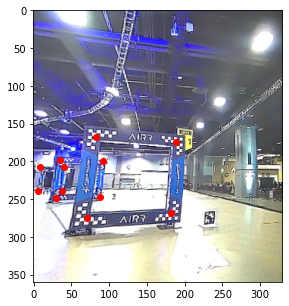

In [5]:
plt.rcParams["figure.figsize"] = (5,5)

# Visualize corner points on image
img_paths, corners = data_loader()
img_path = img_paths[idx]
img_corners_all = xy_corners(img_path, corners)

show_img(img_path, img_corners_all)  


# Generate Sample Points

In [6]:
def delete_edge_points(image, points, patch_dim):
    # Remove all points too close to the edge
    patch_dim = (patch_dim[0], patch_dim[1])
    
    points = points[points[:,0] > patch_dim[1],:]
    points = points[points[:,1] > patch_dim[0],:]
    points = points[points[:,0] < image.shape[1] - patch_dim[1],:]
    points = points[points[:,1] < image.shape[0] - patch_dim[0],:]

    return points

def get_background_points(image, n_points, patch_dim):
   
    # Obtain background points by randomly selecting a number of points from a grid.
    grid = np.array(np.meshgrid(np.linspace(0., image.shape[0], n_points),np.linspace(0., image.shape[1], n_points)))
    points = grid.reshape(2,-1).T

    # Delete points on the edges
    points = delete_edge_points(image, points, patch_dim)
    
    i = np.random.choice(points.shape[0], n_points, replace = False)
    points = points[i,:]
    
    return points

def get_corner_points(image, img_corners, n_points, patch_dim, dist):
    
    # Generate sample points around corners
    var = np.array((dist/3, dist/3)) / 10
    
    all_points = []
    
    for i, pt in enumerate(img_corners):
    
        points = np.random.randn(n_points, 2)
        points = pt + points * var 
        points = delete_edge_points(image, points, patch_dim)
        
        if len(points) == n_points:
            all_points.append(points)

    all_points = np.array(all_points)
    all_points = all_points.reshape(-1,2)
    
    return all_points

def change_label(background_points, corner_points, img_corners, thres):
    
    # Reassign labels, remove points on the border to make the classes better separable. 
    background_points2 = []
    corner_points2 = []
     
    for i, point in enumerate(corner_points):
        Append = False
        for n, corner in enumerate(img_corners):
            dist = np.sqrt(np.sum((point - corner)**2))
         
            if dist <= thres:
                Append = True

        if Append:
            corner_points2.append(point)
            
    for i, point in enumerate(background_points):
        Append = True    
        for n, corner in enumerate(img_corners):
            
            dist = np.sqrt(np.sum((point - corner)**2))
            
            if dist <= thres /3:
                Append = False

        if Append:
            background_points2.append(point)              
            
    return np.array(background_points2), np.array(corner_points2)


def comp_dist(img_corners):
    
    # Compute distance between top left and top right corner, used for scaling.  
    corner1 = img_corners[0]  # Top left
    corner2 = img_corners[1]  # Top right
    dist = np.sqrt(np.sum((corner1 - corner2)**2))
    
    return dist

def nearest_gate(img_corners_all):
    
    # Out of all gates in an image, find the nearest gate
    distlst = []
    
    # Check if there is more than one gate
    if np.prod(np.array(img_corners_all).shape) > 8:
        for i, img_corners in enumerate(img_corners_all):
            dist = comp_dist(img_corners)
            distlst.append(dist)
            
        # This is the gate with the largest distance between its top corners
        nearest_obst_idx = distlst.index(max(distlst))
        return img_corners_all[nearest_obst_idx]
                               
    else:
        # If there is only one gate, just return its corners
        return img_corners_all

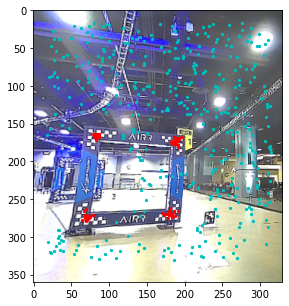

In [7]:
# Find the number of gates
if img_corners_all.shape[1] == 2:   
    n_gates = 1
else:
    n_gates = img_corners_all.shape[0]

# Find the nearest gate only to generate training patches
img_corners = nearest_gate(img_corners_all) 

img = plt.imread(img_path) 
dist = comp_dist(img_corners)
patch_dim = (feat_size, feat_size, 3)

# Get the sample points on the corners
corner_points = get_corner_points(img, img_corners, n_points_corner, patch_dim, dist)

# Get the sample points in the background.
background_points = get_background_points(img, n_points_background, patch_dim)

# Remove overlapping background samples and re-assign labels.
background_points, corner_points = change_label(background_points, corner_points, img_corners_all.reshape(-1,2), dist)

plt.scatter(corner_points[:,0], corner_points[:,1], s = 5, c = 'r')
plt.scatter(background_points[:,0], background_points[:,1], s = 5, c = 'c')

plt.imshow(img)
plt.show()


# Get Patches

In [8]:
def get_patch_at_point(image, point, feat_size): 
    
    # Obtain the patch around each sample point. 
    feat_window = (feat_size, feat_size, 3)
    
    # Get 32x32 window (for feat_size = 16)
    top = int(point[0] - feat_size)
    bottom = int(point[0] + feat_size)
    left = int(point[1] - feat_size)
    right = int(point[1] + feat_size)
    
    # Check if all patch points lie inside image
    assert(top >= 0 and bottom >= 0 and left >= 0 and right >= 0)
    assert(top < bottom and left < right)
    
    patch = image[left:right, top:bottom, :]
    
    # Resize to 16x16 patches
    patch = skimage.transform.resize(patch, feat_window, anti_aliasing=False)
    
    return patch


def plot_patches(background_points, corner_points, n_patch_plots, feat_size):
    # Display some patches
    
    idx_background = np.random.choice(background_points.shape[0], n_patch_plots, replace = False)
    idx_corners = np.random.choice(corner_points.shape[0], n_patch_plots, replace = False)

    patch_corners = corner_points[idx_corners]
    patch_background = background_points[idx_background]

    for i, point in enumerate(patch_corners):
        plt.subplot(2,10,i+1)
        patch = get_patch_at_point(img, patch_corners[i], feat_size)
        plt.imshow(patch)
        plt.xticks([])
        plt.yticks([])

    for i, point in enumerate(patch_background):
        plt.subplot(2,10,i+1+n_patch_plots)
        patch = get_patch_at_point(img, patch_background[i], feat_size)
        plt.imshow(patch)
        plt.xticks([])
        plt.yticks([])
        
def get_patches(points_arr, img, feat_size):
    # Get an array of all patches
    patch_lst = []
    
    for i, point in enumerate(points_arr):
        patch = get_patch_at_point(img, point, feat_size)
        patch_lst.append(patch)
        
    return np.array(patch_lst)


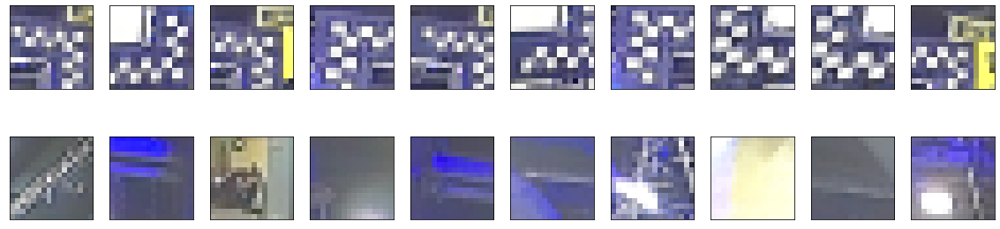

In [9]:
# Plot patches

n_patch_plots = 10

plt.rcParams["figure.figsize"] = (20,5)
plot_patches(background_points, corner_points, n_patch_plots, feat_size)

corner_patches = get_patches(corner_points, img, feat_size)
background_patches = get_patches(background_points, img, feat_size)   

corner_labels = np.ones(corner_patches.shape[0])
background_labels = np.zeros(background_patches.shape[0])

# Get Training and Test Data

In [10]:
def get_data_per_image(img_path, corners, n_points_background, n_points_corner, feat_size):
    
    # Obtain corner annotations
    img_corners_all = xy_corners(img_path, corners)
    
    # Find corners of nearest gate
    img_corners = nearest_gate(img_corners_all) # Only consider nearest obstacle
    
    img = plt.imread(img_path)
    
    dist = comp_dist(img_corners)

    patch_dim = (feat_size, feat_size, 3)

    # Obtain the sample points at the corners
    corner_points = get_corner_points(img, img_corners, n_points_corner, patch_dim, dist)
    
    # Obtain the sample points in the background
    background_points = get_background_points(img, n_points_background, patch_dim)
    
    # Make classes better seperable
    background_points, corner_points = change_label(background_points, corner_points, img_corners, dist)

    # Obtain patches at points
    corner_patches = get_patches(corner_points, img, feat_size)
    background_patches = get_patches(background_points, img, feat_size)   

    # Change labels, corner = 1, background = 0
    corner_labels = np.ones(corner_patches.shape[0])
    background_labels = np.zeros(background_patches.shape[0])

    # Put patches in arrays for training.
    X_train = np.concatenate([corner_patches, background_patches])    # patches
    y_train = np.concatenate([corner_labels, background_labels])      # labels
    points_train = np.concatenate([corner_points, background_points]) # Sample point locations [x,y]

    return X_train, y_train, points_train

In [11]:
# Debugging
random.seed(20)
img_path = img_paths[idx]
X_train, y_train, points_train = get_data_per_image(img_path, corners, n_points_background, n_points_corner, feat_size)

### Load All Data Patches

In [12]:
# Load all patches, labels and patch sample points for all images into one big array

img_paths, corners = data_loader()

X_train = []
y_train = []
points_train = []

X_test = []
y_test = []
points_test = []

# Training set
for i, img_path in enumerate(img_paths[1:240]):   # neglects the first image because of a bug, considering the time vs gain, it was decided not to fix this.
    i_n = i + 1

    if i_n % 15 == 0:
        print(' ', int(i_n / len(img_paths[1:]) * 100), '%')
    else:
        print("=",  end = '')
 
        
    X_train_img, y_train_img, points_train_img = get_data_per_image(img_path, corners, n_points_background, n_points_corner, feat_size)
    
    for i, patch in enumerate(X_train_img):
        X_train.append(patch)
        
    for i, label in enumerate(y_train_img):
        y_train.append(label)
        
    for i, point in enumerate(points_train_img):
        points_train.append(point)
    

# Test set   
for i, img_path in enumerate(img_paths[240:]):
    i = i + 240
  

    if i % 15 == 0:
        print(' ', int(i / len(img_paths[1:]) * 100), '%')
    else:
        print("=",  end = '')
    
    X_test_img, y_test_img, points_test_img = get_data_per_image(img_path, corners, n_points_background, n_points_corner, feat_size)
    
    for i, patch in enumerate(X_test_img):
        X_test.append(patch)
        
    for i, label in enumerate(y_test_img):
        y_test.append(label)
        
    for i, point in enumerate(points_test_img):
        points_test.append(point)
    
print('        100 %')



Loaded 308 images.
==============  4 %
==============  9 %
==============  14 %
==============  19 %
==============  24 %
==============  29 %
==============  34 %
==============  39 %
==============  43 %
==============  48 %
==============  53 %
==============  58 %
==============  63 %
==============  68 %
==============  73 %
==============  78 %
==============  83 %
==============  87 %
==============  92 %
==============  97 %
=======        100 %


In [13]:
# Reshape and transform arrays to make them compatible for training
num_train = len(X_train)
num_test = len(X_test)

X_train2 = np.array(X_train).reshape(num_train, 3, feat_size, feat_size)
y_train2 = np.array(y_train)

X_test2 = np.array(X_test).reshape(num_test, 3, feat_size, feat_size)
y_test2 = np.array(y_test)

In [14]:
X_train3  = torch.from_numpy(X_train2)
X_test3 = torch.from_numpy(X_test2)

y_train3 = torch.from_numpy(y_train2).type(torch.long)
y_test3 = torch.from_numpy(y_test2).type(torch.long)


# Convolutional Neural Networks

In [15]:
# 1 layer CNN
class Net1(nn.Module):
    
    def __init__(self, in_channels, hidden_channels, out_features):
        super(Net1, self).__init__()

        # convolution
        self.conv1 = nn.Conv2d(in_channels, hidden_channels[0], kernel_size=5, padding=2)
        
        # ReLU activation function
        self.relu1 = nn.ReLU()
        
        # Max- pooling
        self.max_pool1 = nn.MaxPool2d(2)
        
        # Fully connected layer
        self.fc = nn.Linear(int((feat_size/2)**2*hidden_channels[0]), out_features)

    # Forward pass
    def forward(self, x):
       
        x = self.conv1(x)
        x = self.relu1(x)
        x = self.max_pool1(x)
        x = x.view(x.size(0), -1)
        x = self.fc(x)
        
        return x

# 2 layer CNN    
class Net2(nn.Module):
    
    def __init__(self, in_channels, hidden_channels, out_features):
        super(Net2, self).__init__()

        self.conv1 = nn.Conv2d(in_channels, hidden_channels[0], kernel_size=5, padding=2)
        self.relu1 = nn.ReLU()
        self.max_pool1 = nn.MaxPool2d(2)
        self.conv2 = nn.Conv2d(hidden_channels[0], hidden_channels[1], kernel_size=5, padding=2)
        self.relu2 = nn.ReLU()
        self.max_pool2 = nn.MaxPool2d(2)
        self.fc = nn.Linear(int((feat_size/4)**2*hidden_channels[1]), out_features)

    # Forward pass
    def forward(self, x):
        x = self.conv1(x)
        x = self.relu1(x)
        x = self.max_pool1(x)
        x = self.conv2(x)
        x = self.relu2(x)
        x = self.max_pool2(x)
        x = x.view(x.size(0), -1)
        x = self.fc(x)
        return x
    
# 3 layer CNN
class Net3(nn.Module):
    
    def __init__(self, in_channels, hidden_channels, out_features):
        super(Net3, self).__init__()

        self.conv1 = nn.Conv2d(in_channels, hidden_channels[0], kernel_size=5, padding=2)
        self.relu1 = nn.ReLU()
        self.max_pool1 = nn.MaxPool2d(2)
        self.conv2 = nn.Conv2d(hidden_channels[0], hidden_channels[1],  kernel_size=5, padding=2)
        self.relu2 = nn.ReLU()
        self.max_pool2 = nn.MaxPool2d(2)
        self.conv3 = nn.Conv2d(hidden_channels[1], hidden_channels[2], kernel_size=5, padding=2)
        self.relu3 = nn.ReLU()
        self.max_pool3 = nn.MaxPool2d(2)
        self.fc = nn.Linear(int((feat_size/8)**2*hidden_channels[2]), out_features)

    # Forward pass
    def forward(self, x):
        x = self.conv1(x)
        x = self.relu1(x)
        x = self.max_pool1(x)
        x = self.conv2(x)
        x = self.relu2(x)
        x = self.max_pool2(x)
        x = self.conv3(x)
        x = self.relu3(x)
        x = self.max_pool3(x)
        x = x.view(x.size(0), -1)
        x = self.fc(x)
        return x



In [16]:
# Functions taken from SC4240 assignment 

def try_gpu():   
    # Check if cuda is available
    if torch.cuda.is_available():
        device = torch.device('cuda:0')
    else:
        device = torch.device('cpu')
    return device

def evaluate_accuracy(data_loader, net, device=torch.device('cpu')):
    
   # Evaluate accuracy of network
    net.eval()  
    acc_sum = torch.tensor([0], dtype=torch.float32, device=device)
    n = 0

    for X, y in data_loader:
        X, y = X.to(device), y.to(device)
        with torch.no_grad():
            y = y.long()
            acc_sum += torch.sum((torch.argmax(net(X), dim=1) == y))
            n += y.shape[0]
            
    return acc_sum.item()/n

In [17]:
# Define channels (1,2 and 3 stand for the number of convolutional layers)
in_channels = 3
hidden_channels1 = [5]
hidden_channels2 = [5, 5]
hidden_channels3 = [5, 5, 5]
out_features = 2 

# Training parameters
learning_rate = 0.0003
epochs = 20

# Initialize networks
print('Net 1')
net1 = Net1(in_channels, hidden_channels1, out_features)
summary(net1, (3, feat_size, feat_size), device='cpu')  # (in_channels, height, width)

print('Net 2')
net2 = Net2(in_channels, hidden_channels2, out_features)
summary(net2, (3, feat_size, feat_size), device='cpu') 

print('Net 3')
net3 = Net3(in_channels, hidden_channels3, out_features)
summary(net3, (3, feat_size, feat_size), device='cpu')

# Define optimizers
optimizer1 = torch.optim.Adam(net1.parameters(), lr = learning_rate)
optimizer2 = torch.optim.Adam(net2.parameters(), lr = learning_rate)
optimizer3 = torch.optim.Adam(net3.parameters(), lr = learning_rate)
criterion = nn.CrossEntropyLoss()

# Set batch size to prevent overfitting
n_batch_train = 1000
n_batch_test = 10000

# Define datasets
train_data = TensorDataset(X_train3, y_train3) 
test_data = TensorDataset(X_test3, y_test3)

# Define data loaders used to iterate through dataset
train_loader = DataLoader(train_data, batch_size=n_batch_train, shuffle=True)
test_loader = DataLoader(test_data, batch_size=n_batch_test, shuffle = True)


Net 1
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 5, 16, 16]             380
              ReLU-2            [-1, 5, 16, 16]               0
         MaxPool2d-3              [-1, 5, 8, 8]               0
            Linear-4                    [-1, 2]             642
Total params: 1,022
Trainable params: 1,022
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.02
Params size (MB): 0.00
Estimated Total Size (MB): 0.03
----------------------------------------------------------------
Net 2
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1            [-1, 5, 16, 16]             380
              ReLU-2            [-1, 5, 16, 16]               0
         MaxPool2d-3             

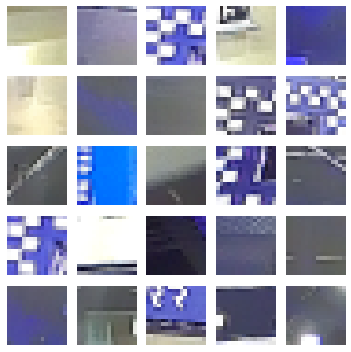

In [18]:
# Display example patches
fig, axs = plt.subplots(5, 5, figsize=(5, 5))

for i in range(25):
    i_n = np.random.choice(len(test_data),1, replace = False)
    x, _ = test_data[i_n]
    ax = axs[i // 5][i % 5]
    ax.imshow(x.view(feat_size, feat_size, 3) )
    ax.axis('off')
    ax.axis('off')
plt.tight_layout()
plt.show()


# Training

In [19]:
def train(net, optimizer, criterion, epochs, train_loader, test_loader):

    # Define list to store losses and performances of each iteration
    train_losses = []
    train_accs = []
    test_accs = []

    # Try using gpu instead of cpu
    device = try_gpu()

    for epoch in range(epochs):

        # Network in training mode and to device
        net.train()
        net.to(device)

        # Training loop
        for i, (x_batch, y_batch) in enumerate(train_loader):

            # Set to same device
            x_batch, y_batch = x_batch.to(device), y_batch.to(device)

            # Set the gradients to zero
            optimizer.zero_grad()

            # Perform forward pass
            y_pred = net(x_batch)

            # Compute the loss
            loss = criterion(y_pred, y_batch)
            train_losses.append(loss)

            # Backprop 
            loss.backward()
            optimizer.step()

       # Compute train and test accuracy
        train_acc = 100*evaluate_accuracy(train_loader, net.to('cpu'))
        test_acc = 100*evaluate_accuracy(test_loader, net.to('cpu'))

        # Development of performance
        train_accs.append(train_acc)
        test_accs.append(test_acc)

        # Print performance
        print('Epoch: {:.0f}'.format(epoch+1))
        print('Accuracy of train set: {:.00f}%'.format(train_acc))
        print('Accuracy of test set: {:.00f}%'.format(test_acc))
        print('')
        
    return net, train_losses, train_accs, test_accs

In [20]:
net1, train_losses1, train_accs1, test_accs1 = train(net1, optimizer1, criterion, epochs, train_loader, test_loader)

Epoch: 1
Accuracy of train set: 85%
Accuracy of test set: 82%

Epoch: 2
Accuracy of train set: 85%
Accuracy of test set: 82%

Epoch: 3
Accuracy of train set: 86%
Accuracy of test set: 85%

Epoch: 4
Accuracy of train set: 89%
Accuracy of test set: 88%

Epoch: 5
Accuracy of train set: 90%
Accuracy of test set: 90%

Epoch: 6
Accuracy of train set: 92%
Accuracy of test set: 93%

Epoch: 7
Accuracy of train set: 92%
Accuracy of test set: 92%

Epoch: 8
Accuracy of train set: 92%
Accuracy of test set: 93%

Epoch: 9
Accuracy of train set: 93%
Accuracy of test set: 94%

Epoch: 10
Accuracy of train set: 93%
Accuracy of test set: 93%

Epoch: 11
Accuracy of train set: 93%
Accuracy of test set: 94%

Epoch: 12
Accuracy of train set: 94%
Accuracy of test set: 94%

Epoch: 13
Accuracy of train set: 94%
Accuracy of test set: 94%

Epoch: 14
Accuracy of train set: 94%
Accuracy of test set: 94%

Epoch: 15
Accuracy of train set: 94%
Accuracy of test set: 94%

Epoch: 16
Accuracy of train set: 94%
Accuracy of 

In [21]:
net2, train_losses2, train_accs2, test_accs2 = train(net2, optimizer2, criterion, epochs, train_loader, test_loader)

Epoch: 1
Accuracy of train set: 85%
Accuracy of test set: 82%

Epoch: 2
Accuracy of train set: 85%
Accuracy of test set: 82%

Epoch: 3
Accuracy of train set: 84%
Accuracy of test set: 82%

Epoch: 4
Accuracy of train set: 86%
Accuracy of test set: 84%

Epoch: 5
Accuracy of train set: 89%
Accuracy of test set: 88%

Epoch: 6
Accuracy of train set: 89%
Accuracy of test set: 89%

Epoch: 7
Accuracy of train set: 92%
Accuracy of test set: 91%

Epoch: 8
Accuracy of train set: 93%
Accuracy of test set: 93%

Epoch: 9
Accuracy of train set: 94%
Accuracy of test set: 95%

Epoch: 10
Accuracy of train set: 94%
Accuracy of test set: 95%

Epoch: 11
Accuracy of train set: 94%
Accuracy of test set: 95%

Epoch: 12
Accuracy of train set: 95%
Accuracy of test set: 95%

Epoch: 13
Accuracy of train set: 95%
Accuracy of test set: 95%

Epoch: 14
Accuracy of train set: 95%
Accuracy of test set: 95%

Epoch: 15
Accuracy of train set: 95%
Accuracy of test set: 96%

Epoch: 16
Accuracy of train set: 96%
Accuracy of 

In [22]:
net3, train_losses3, train_accs3, test_accs3 = train(net3, optimizer3, criterion, epochs, train_loader, test_loader)

Epoch: 1
Accuracy of train set: 85%
Accuracy of test set: 82%

Epoch: 2
Accuracy of train set: 85%
Accuracy of test set: 82%

Epoch: 3
Accuracy of train set: 88%
Accuracy of test set: 87%

Epoch: 4
Accuracy of train set: 90%
Accuracy of test set: 93%

Epoch: 5
Accuracy of train set: 91%
Accuracy of test set: 93%

Epoch: 6
Accuracy of train set: 92%
Accuracy of test set: 94%

Epoch: 7
Accuracy of train set: 93%
Accuracy of test set: 94%

Epoch: 8
Accuracy of train set: 93%
Accuracy of test set: 94%

Epoch: 9
Accuracy of train set: 94%
Accuracy of test set: 95%

Epoch: 10
Accuracy of train set: 94%
Accuracy of test set: 95%

Epoch: 11
Accuracy of train set: 94%
Accuracy of test set: 95%

Epoch: 12
Accuracy of train set: 95%
Accuracy of test set: 95%

Epoch: 13
Accuracy of train set: 95%
Accuracy of test set: 95%

Epoch: 14
Accuracy of train set: 95%
Accuracy of test set: 95%

Epoch: 15
Accuracy of train set: 95%
Accuracy of test set: 95%

Epoch: 16
Accuracy of train set: 96%
Accuracy of 

# CNN Evaluation

In [23]:
def plot_eval(train_losses, train_accs, test_accs):
    # Plot training curves
    plt.figure()
    plt.subplot(1,2,1)
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.plot(train_losses)
    plt.grid()

    plt.subplot(1,2,2)
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy (%)')
    plt.plot(train_accs, label = 'train')
    plt.plot(test_accs, label = 'test')
    plt.legend()
    plt.grid()

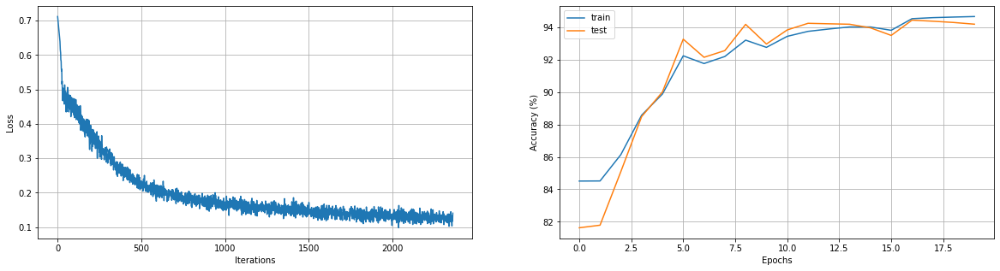

In [24]:
plot_eval(train_losses1, train_accs1, test_accs1) 

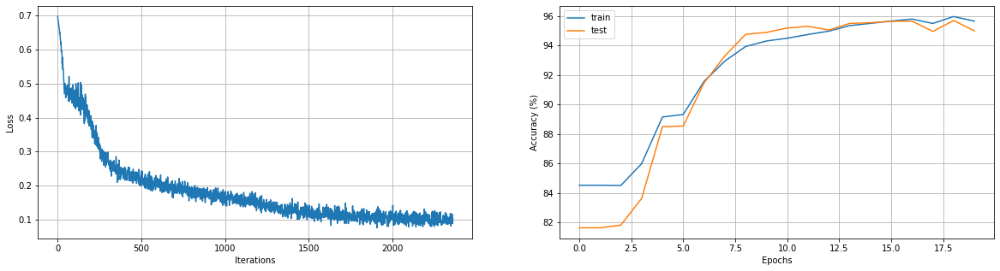

In [25]:
plot_eval(train_losses2, train_accs2, test_accs2) 

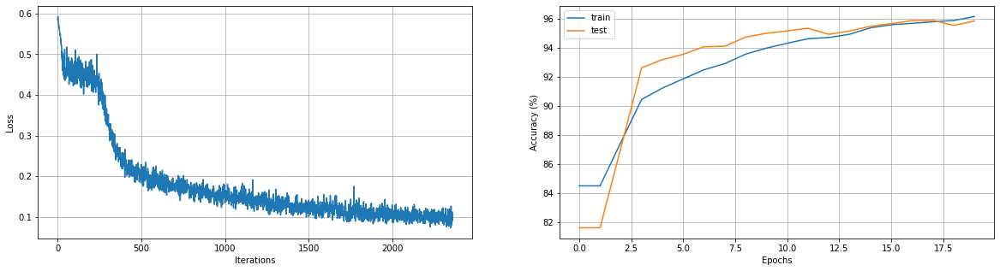

In [26]:
plot_eval(train_losses3, train_accs3, test_accs3) 

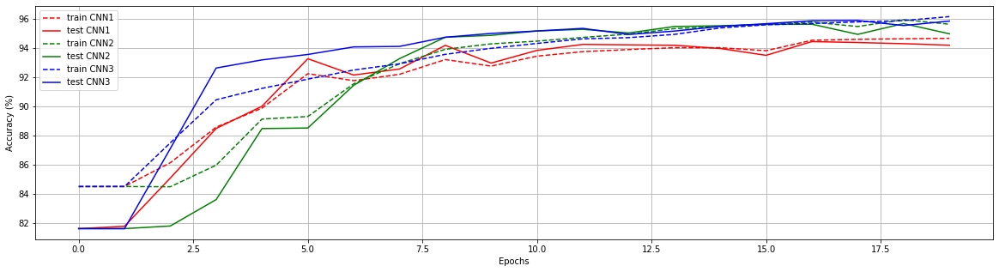

In [27]:
# Plot training curves for all networks in one figure
plt.figure()

plt.xlabel('Epochs')
plt.ylabel('Accuracy (%)')
plt.plot(train_accs1, label = 'train CNN1', c = 'r', ls = 'dashed')
plt.plot(test_accs1, label = 'test CNN1', c = 'r')
plt.plot(train_accs2, label = 'train CNN2', c = 'g', ls = 'dashed')
plt.plot(test_accs2, label = 'test CNN2', c = 'g')
plt.plot(train_accs3, label = 'train CNN3', c = 'b', ls = 'dashed')
plt.plot(test_accs3, label = 'test CNN3', c = 'b')
plt.legend()
plt.grid()

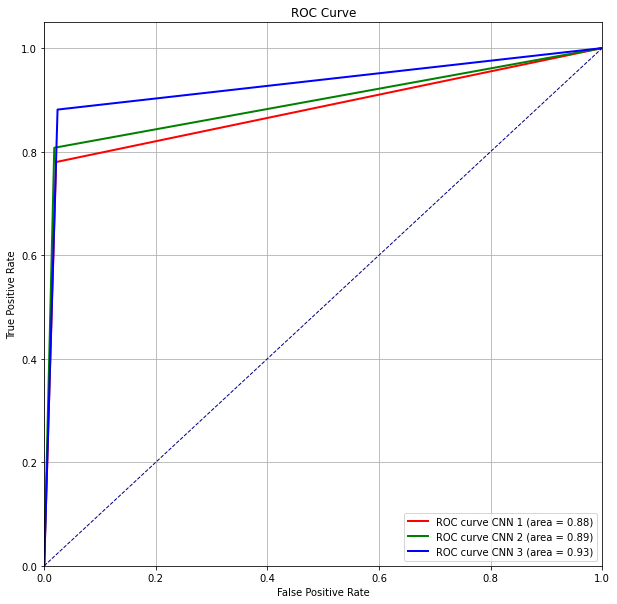

In [28]:
# Compute ROC curve and ROC area for each class

plt.rcParams["figure.figsize"] = (10,10)

def get_ROC(y_test, X_test3, net):
    y_real = y_test
    y_pred = net(X_test3)
    y_pred = torch.argmax(y_pred, axis=1)

    fpr, tpr, thresholds = roc_curve(y_real, y_pred, pos_label=1)
    roc_auc = auc(fpr, tpr)
    
    return fpr, tpr, roc_auc

fpr1, tpr1, roc_auc1 = get_ROC(y_test, X_test3, net1)
fpr2, tpr2, roc_auc2 = get_ROC(y_test, X_test3, net2)
fpr3, tpr3, roc_auc3 = get_ROC(y_test, X_test3, net3)


plt.figure()
plt.plot(fpr1, tpr1, c = 'r', lw = 2, label='ROC curve CNN 1 (area = %0.2f)' % roc_auc1)
plt.plot(fpr2, tpr2, c = 'g', lw = 2, label='ROC curve CNN 2 (area = %0.2f)' % roc_auc2)
plt.plot(fpr3, tpr3, c = 'b', lw = 2, label='ROC curve CNN 3 (area = %0.2f)' % roc_auc3)
plt.plot([0, 1], [0, 1], color='navy', lw=1, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()


In [29]:
# Save trained networks on disc
folder = os.getcwd()
save_path = folder+'\models'
if not os.path.exists(save_path):
        os.makedirs(save_path)

torch.save(net1.state_dict(), os.path.join(save_path,'net1.pth'))
torch.save(net2.state_dict(), os.path.join(save_path,'net2.pth'))
torch.save(net3.state_dict(), os.path.join(save_path,'net3.pth'))

# Corner Detection

## Load Model

In [30]:
# Load trained network
net3 = Net3(in_channels, hidden_channels3, out_features)
net3.load_state_dict(torch.load(os.path.join(save_path,'net3.pth')))
net3.eval()

Net3(
  (conv1): Conv2d(3, 5, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (relu1): ReLU()
  (max_pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2): Conv2d(5, 5, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (relu2): ReLU()
  (max_pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv3): Conv2d(5, 5, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
  (relu3): ReLU()
  (max_pool3): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc): Linear(in_features=20, out_features=2, bias=True)
)

## Obtain Patches in Sample Points

In [31]:
def get_patches_eval(points_arr, img):
    
    # Get patches for one image
    patch_lst = []
    
    for i, point in enumerate(points_arr):
        patch_lst.append(get_patch_at_point_eval(img, point))
        
    return np.array(patch_lst)

def get_patch_at_point_eval(image, point): 
    
    # Get patch at point
    top = int(point[0] - feat_size/2)
    bottom = int(point[0] + feat_size/2)
    left = int(point[1] - feat_size/2)
    right = int(point[1] + feat_size/2)
    
    return image[left:right, top:bottom, :]




In [32]:
%%time
# Obtain sample points for evaluation image
img = plt.imread(img_paths[idx]) 

img_resize = skimage.transform.resize(img, (img.shape[0] // 2, img.shape[1] // 2), anti_aliasing=False)
img_size_x = img_resize.shape[1]
img_size_y = img_resize.shape[0]

Xgrid = np.linspace(feat_size//2, img_size_x - feat_size//2, int(np.sqrt(n_samples)))
Ygrid = np.linspace(feat_size//2, img_size_y - feat_size//2, int(np.sqrt(n_samples)))

grid = np.array(np.meshgrid(Xgrid, Ygrid))
points = grid.reshape(2,-1).T

Wall time: 46.7 ms


In [33]:
# Show sampled points
def show_points(points, img):
    plt.figure()
    plt.imshow(img)
    plt.scatter(points[:,0], points[:,1], s = 40, c = 'r')
    plt.axis('off')

    return plt


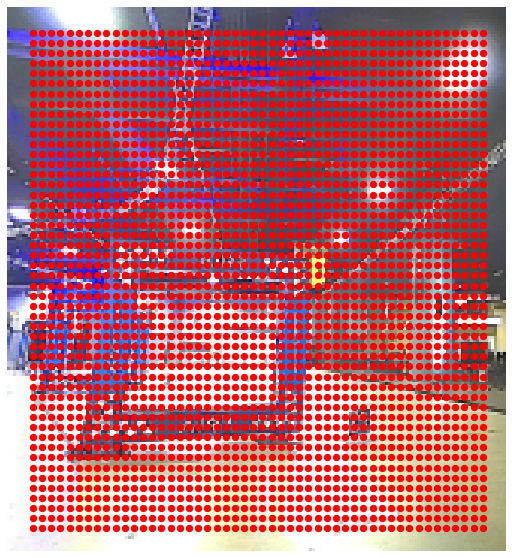

In [34]:
plt.rcParams["figure.figsize"] = (10, 10)
fig = show_points(points, img_resize)

In [35]:
%%time

# Obtain evaluation data and transform
X_data = get_patches_eval(points, img_resize)
X_data = X_data.reshape(X_data.shape[0], 3, feat_size, feat_size)
X_data  = torch.from_numpy(X_data)

Wall time: 18.9 ms


torch.Size([16, 16, 3])


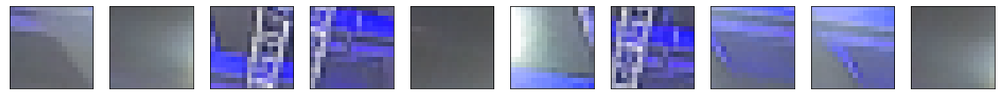

In [36]:
plt.rcParams["figure.figsize"] = (20,20)

# Show patches
for i in range(10):
        i_n = np.random.choice(len(img_paths),1, replace = False)
        plt.subplot(1,10,i+1)
        patch = X_data[i_n].reshape(feat_size, feat_size, 3)
        plt.imshow(patch)
        plt.xticks([])
        plt.yticks([])
print(patch.shape)

## Evaluate Model on Patches 

In [37]:
%%time

# Filter outliers with DBscan
y_data = net3(X_data).argmax(-1)
corner_points = points[y_data == 1]*2

db = DBSCAN(eps=16, min_samples=6).fit(corner_points)
labels = db.labels_
corner_points_no_noise = corner_points[labels != -1]


Wall time: 83.8 ms


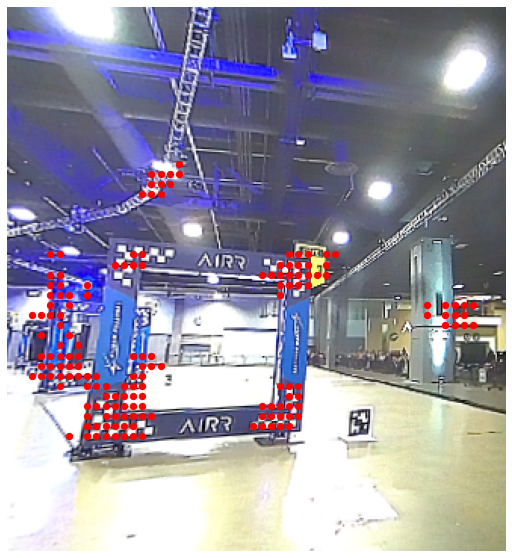

In [38]:
plt.rcParams["figure.figsize"] = (10, 10)
plt1 = show_points(corner_points_no_noise, img)


In [39]:
def eval_img(idx, img_paths, n_samples, feat_size):

    # Find all points on gate
    img = plt.imread(img_paths[idx]) 
    img_resize = skimage.transform.resize(img, (img.shape[0] // 2, img.shape[1] // 2), anti_aliasing=False)
    
    # Reshape
    img_size_x = img_resize.shape[1]
    img_size_y = img_resize.shape[0]

    # Create grid points
    Xgrid = np.linspace(feat_size/2, img_size_x - feat_size/2, int(np.sqrt(n_samples)))
    Ygrid = np.linspace(feat_size/2, img_size_y - feat_size/2, int(np.sqrt(n_samples)))

    grid = np.array(np.meshgrid(Xgrid, Ygrid))
    points = grid.reshape(2,-1).T

    # Put in data vector for evaluation
    X_data = get_patches_eval(points, img_resize)
    X_data = X_data.reshape(X_data.shape[0], 3, feat_size, feat_size)
    X_data  = torch.from_numpy(X_data)
    
    # Obtain labels from CNN
    y_data = net3(X_data)
    y_data = y_data.argmax(-1)
    gate_points = points[y_data == 1]*2
    
    # Filter outliers
    db = DBSCAN(eps=16, min_samples=6).fit(gate_points)
    labels = db.labels_ 
    gate_points_no_noise = gate_points[labels != -1]
    
    return gate_points_no_noise



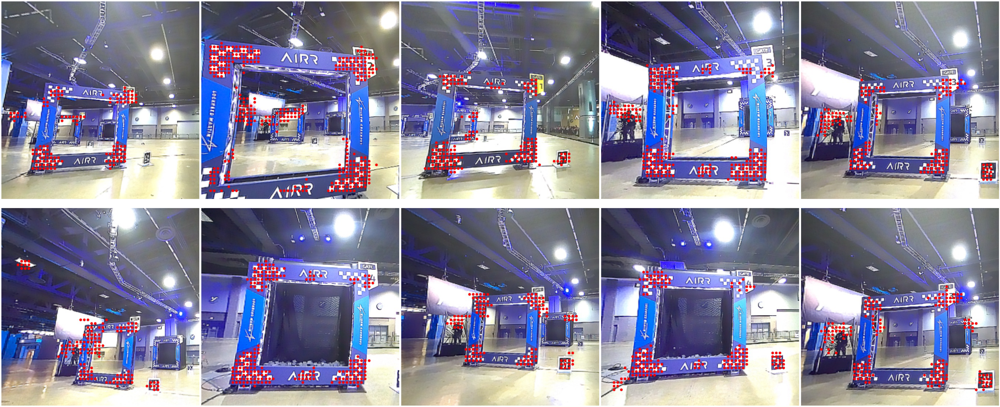

In [47]:
def fig_to_img(fig):
    # Save figure on disc
    fig.savefig("fig.jpg", bbox_inches='tight',pad_inches = 0)
    img = plt.imread("fig.jpg")
    return img

def crop_square(img):
    # Crop image to a square, centered in the middle
    y = img.shape[0]
    x = img.shape[1]
    square = np.max([x, y])
    start_x = x//2-square//2
    start_y = y//2-square//2    
    return img[start_y:start_y+square,start_x:start_x+square]

for i, i_n in enumerate(np.random.choice(len(img_paths),10, replace = False)):
        plt.rcParams["figure.figsize"] = (10,10)   
        img = plt.imread(img_paths[i_n]) 
        img = crop_square(img)
        gate_points = eval_img(i_n, img_paths, n_samples, feat_size)
        print("=",  end = '')
        
        plt1 = show_points(gate_points, img)
        img1 = fig_to_img(plt1)
        plt1.close()
        
        plt.rcParams["figure.figsize"] = (70,30)   
        plt.subplot(2, 5, i+1)
        plt.imshow(img1)
        plt.axis('off')
    
plt.tight_layout()
plt.savefig("fig.jpg", bbox_inches='tight',pad_inches = 0)

In [41]:
def correct_detected(idx, img_paths, corners):
    # Compute the number of correct detected obstacles
    
    img_path = img_paths[idx]
    img_corners_all = xy_corners(img_path, corners)
    corners_real = nearest_gate(img_corners_all)
    gate_points = eval_img(idx, img_paths, n_samples, feat_size)

    dim = 20
    corners_detected = 0
   
    for i, corner in enumerate(corners_real):
        x_c = corner[0]
        y_c = corner[1]

        points_on_corner = gate_points[gate_points[:,0] < x_c + dim]
        points_on_corner = points_on_corner[points_on_corner[:,0] > x_c - dim]

        points_on_corner = points_on_corner[points_on_corner[:,1] < y_c + dim]
        points_on_corner = points_on_corner[points_on_corner[:,1] > y_c - dim]


        if points_on_corner.shape[0] >= 6:
            corners_detected += 1

    if corners_detected >= 3:
        correct_detected = 1
        
    else:
        correct_detected = 0

    return gate_points, correct_detected

In [42]:
acc = 0

# Set plot size
plt.rcParams["figure.figsize"] = (10, 10)
plt.tight_layout()

# Create folder to store evaluation images
folder = str(os.getcwd())
a =  str(folder+'\\perf_evaluation\\')
if not os.path.exists(a):
        os.makedirs(a)

# Evaluate model on all images in the folder
for i in range(1, len(img_paths)):
    img_path = img_paths[i]
    img_name = image_name(img_path)
    X = plt.imread(img_path)
    gate_points, success = correct_detected(i, img_paths, corners)
    
    acc += success
    
    plt.imshow(X)
    plt.scatter(gate_points[:,0], gate_points[:,1], c = 'r', s = 40)
    plt.axis('off')      
    
    # Label it based on correct prediction
    if success:
         k = str('T_')
    else: 
        k = str('F_')
    
    # Save image
    b =  str(a+k+'_'+str(i)+img_name)
    plt.savefig(b, bbox_inches='tight',pad_inches = 0)
    plt.close()
    
     # Print progress
    if i % 15 == 0 and i != 0:
        print(' ', int(i / len(img_paths) * 100), '%')
    elif i == 0:
        print('Start Evaluation')
    else:
        print("=",  end = '')
        
    
print( '\n')
print( '******************************************************')
print('Predicted ', acc, ' out of', len(img_paths)-1, 'nearest obstacles correctly. \n')
print('Accuracy:', np.round(acc/(len(img_paths)-1), 3 ) )
print( '******************************************************')


==============  4 %
==============  9 %
==============  14 %
==============  19 %
==============  24 %
==============  29 %
==============  34 %
==============  38 %
==============  43 %
==============  48 %
==============  53 %
==============  58 %
==============  63 %
==============  68 %
==============  73 %
==============  77 %
==============  82 %
==============  87 %
==============  92 %
==============  97 %

******************************************************
Predicted  294  out of 307 nearest obstacles correctly. 

Accuracy: 0.958
******************************************************
